# Advanced Lane Finding

## Pipeline:
- **Compute Camera Calibration.**
- **Apply Distortion Correction**.
- **Apply a Perspective Transform.**
- **Create a Thresholded Binary Image.**
- **Define the Image Processing Pipeline.**
- **Detect Lane Lines.**
- **Determine the Curvature of the Lane and Vehicle Position.**
- **Visual display of the Lane Boundaries and Numerical Estimation of Lane Curvature and Vehicle Position.**
- **Process Project Videos.**

In [117]:
# Importing Python libraries
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [118]:
def display(img1, img2, lbl1, lbl2, x, y, img3=[], lbl3=[], cmap=None, n = 2):
    plt.figure(figsize=(x, y))
    plt.subplot(1, n, 1)
    plt.imshow(img1, cmap = cmap)
    plt.xlabel(lbl1, fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, n, 2)
    plt.imshow(img2, cmap = cmap)
    plt.xlabel(lbl2, fontsize=15)
    plt.xticks([])
    plt.yticks([])
    if n == 3:
        plt.subplot(1, n, 3)
        plt.imshow(img3, cmap = cmap)
        plt.xlabel(lbl3, fontsize=15)
        plt.xticks([])
        plt.yticks([])
    plt.show()

---
## Step 1: Compute Camera Calibration

In [119]:
cal_images = glob.glob('camera_cal/*.jpg')
test_images = glob.glob('test_images/*.jpg')

nx, ny = 9, 6
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)

In [120]:
def calibrate_camera(cal_images, nx, ny):
    objpoints = []  # 3D points
    imgpoints = []  # 2D points
    
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)

    for file in cal_images:
        img = cv2.imread(file)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    return mtx, dist

In [121]:
mtx, dist = calibrate_camera(cal_images, nx, ny)

---
## Step 2: Apply Distortion Correction

In [122]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

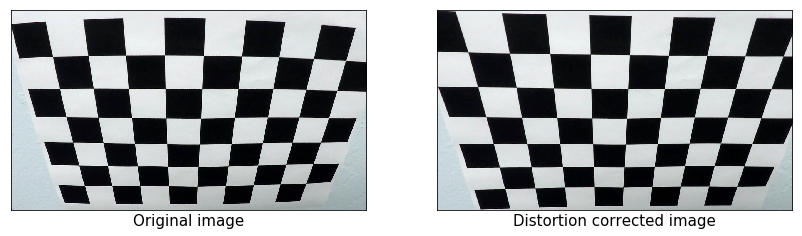

In [123]:
# Testing distortion correction on cal_images
img = cv2.imread(cal_images[8])
undist = undistort(img, mtx, dist)
display(img, undist, 'Original image', 'Distortion corrected image', 14, 7)

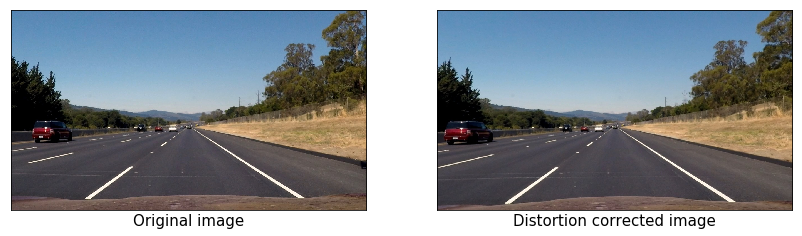

In [124]:
# Testing distortion correction on test_images
img = cv2.cvtColor(cv2.imread(test_images[6]), cv2.COLOR_BGR2RGB)
undist_img_ex = undistort(img, mtx, dist)
display(img, undist_img_ex, 'Original image', 'Distortion corrected image', 14, 7)

---
## Step 3: Apply a Perspective Transform

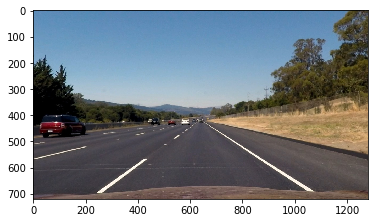

In [125]:
image_shape = undist_img_ex.shape
plt.imshow(undist_img_ex)
plt.show()

In [126]:
# Define the region of interest
src = np.float32([[190, 700], [1110, 700], [720, 470], [570, 470]])

bottom_left = src[0][0]+100, src[0][1]
bottom_right = src[1][0]-200, src[1][1]
top_left = src[3][0]-250, 1
top_right = src[2][0]+200, 1
dst = np.float32([bottom_left, bottom_right, top_right, top_left])
print(dst)

[[ 290.  700.]
 [ 910.  700.]
 [ 920.    1.]
 [ 320.    1.]]


In [127]:
def perspective_transform(img, src, dst):
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    # Return the resulting image and matrix
    return warped, M, Minv

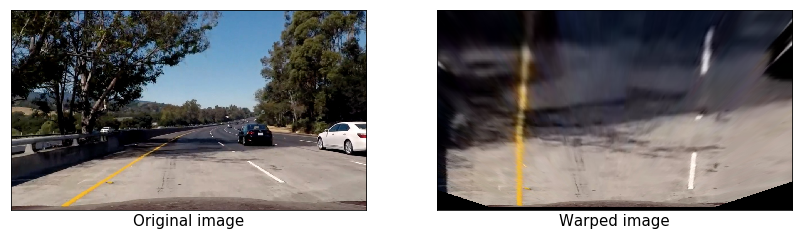

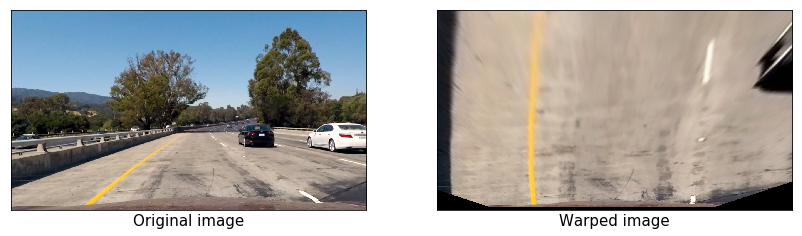

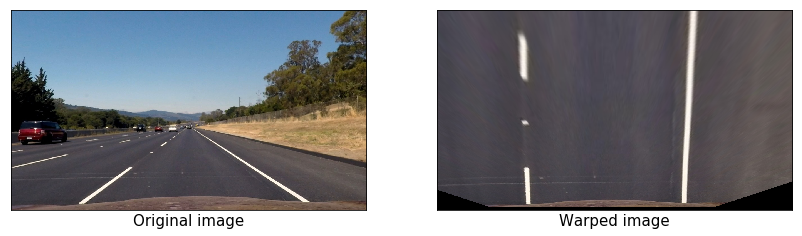

In [128]:
# Applying perspective transform to several test_images
display(undistort(cv2.cvtColor(cv2.imread(test_images[1]), cv2.COLOR_BGR2RGB), mtx, dist),
        perspective_transform(undistort(cv2.cvtColor(cv2.imread(test_images[1]), cv2.COLOR_BGR2RGB),
                                        mtx, dist), src, dst)[0],
        'Original image', 'Warped image', 14, 7)
display(undistort(cv2.cvtColor(cv2.imread(test_images[7]), cv2.COLOR_BGR2RGB), mtx, dist),
        perspective_transform(undistort(cv2.cvtColor(cv2.imread(test_images[7]), cv2.COLOR_BGR2RGB),
                                        mtx, dist), src, dst)[0],
        'Original image', 'Warped image', 14, 7)
display(undistort(cv2.cvtColor(cv2.imread(test_images[6]), cv2.COLOR_BGR2RGB), mtx, dist),
        perspective_transform(undistort(cv2.cvtColor(cv2.imread(test_images[6]), cv2.COLOR_BGR2RGB),
                                        mtx, dist), src, dst)[0],
        'Original image', 'Warped image', 14, 7)

In [129]:
undist_example_warped = perspective_transform(undist_img_ex, src, dst)[0]

---
## Step 4: Create a Thresholded Binary Image

### Color Space Thresholding

In [130]:
def hls_l_thresh(img, thresh=(220, 255)):
    img = img[:,:,1]
    img = img*(255/np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

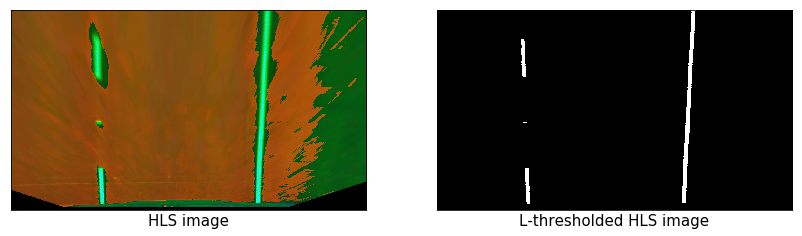

In [131]:
thresh_HLS = hls_l_thresh(undist_example_HLS)
display(undist_example_HLS, thresh_HLS, 'HLS image', 'L-thresholded HLS image', 14, 7, cmap = 'gray')

In [132]:
def lab_b_thresh(img, thresh=(190, 255)):
    img = img[:,:,2]
    if np.max(img) > 175:
        img = img*(255/np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

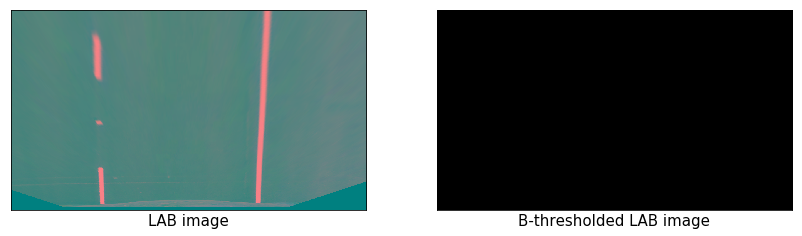

In [133]:
thresh_LAB = lab_b_thresh(undist_example_LAB)
display(undist_example_LAB, thresh_LAB, 'LAB image', 'B-thresholded LAB image', 14, 7, cmap = 'gray')

In [134]:
def threshold_color_space(img):
    img_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_LAB = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    img_thresh_HLS = hls_l_thresh(img_HLS)
    img_thresh_LAB = lab_b_thresh(img_LAB)
    combined_img = np.zeros_like(img_thresh_HLS)
    combined_img[((img_thresh_HLS == 1) | (img_thresh_LAB == 1))] = 1
    return combined_img

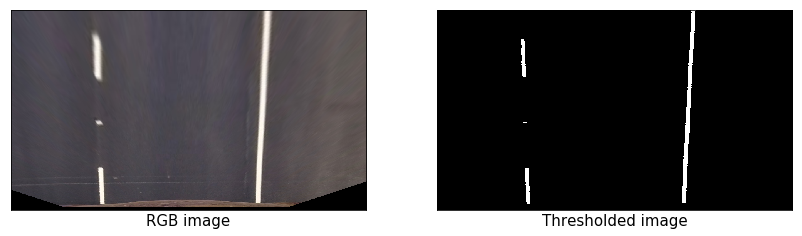

In [135]:
threshold_color_img = threshold_color_space(undist_example_warped)
display(undist_example_warped, threshold_color_img, 'RGB image', 'Thresholded image', 14, 7, cmap = 'gray')

### Sobel Differentiation

Now, we'll explore different Sobel differentiation techniques, and try to come up with a combination that produces a better output than color space thresholding.

In [136]:
def abs_sobel(img, orient='x', sobel_kernel=3, thresh=(25, 255)):
    sobel = cv2.Sobel(img, cv2.CV_64F, orient=='x', orient=='y', ksize= sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary

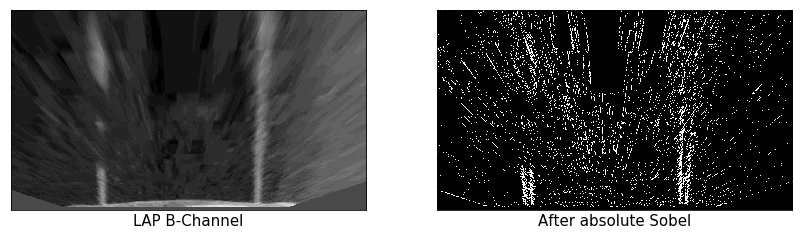

In [137]:
abs_sobel_example_LAB_B = abs_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, abs_sobel_example_LAB_B, 'LAP B-Channel', 'After absolute Sobel', 14, 7, cmap='gray')

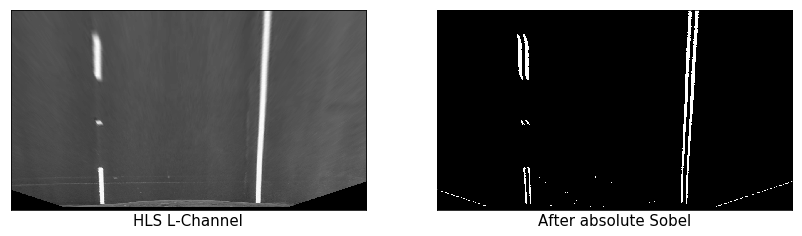

In [138]:
abs_sobel_example_HLS_L = abs_sobel(undist_example_HLS_L)
display(undist_example_HLS_L, abs_sobel_example_HLS_L, 'HLS L-Channel', 'After absolute Sobel', 14, 7, cmap='gray')

In [139]:
def mag_sobel(img, sobel_kernel=15, thresh=(25, 255)):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary

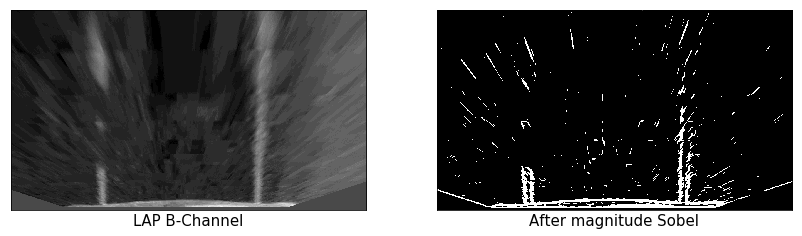

In [140]:
mag_sobel_example_LAB_B = mag_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, mag_sobel_example_LAB_B, 'LAP B-Channel', 'After magnitude Sobel', 14, 7, cmap='gray')

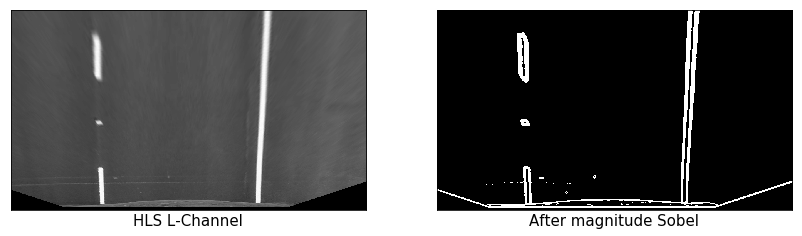

In [141]:
mag_sobel_example_HLS_L = mag_sobel(undist_example_HLS_L)
display(undist_example_HLS_L, mag_sobel_example_HLS_L, 'HLS L-Channel', 'After magnitude Sobel', 14, 7, cmap='gray')

In [142]:
def dir_sobel(img, sobel_kernel=25, thresh=(0, 0.09)):    
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return binary_output

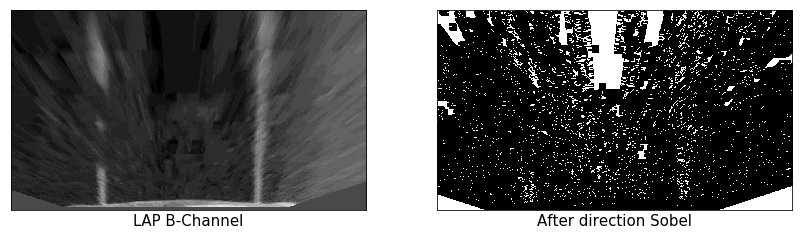

In [143]:
dir_sobel_example_LAB_B = dir_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, dir_sobel_example_LAB_B, 'LAP B-Channel', 'After direction Sobel', 14, 7, cmap='gray')

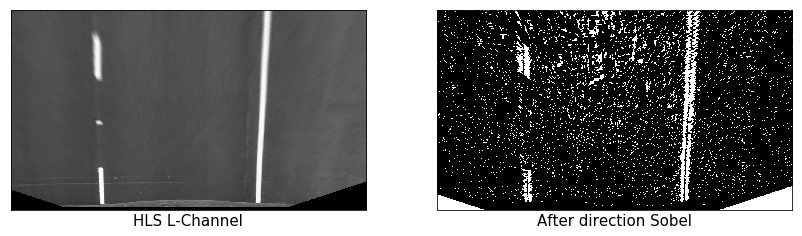

In [144]:
dir_sobel_example_HLS_L = dir_sobel(undist_example_HLS_L)
display(undist_example_HLS_L, dir_sobel_example_HLS_L, 'HLS L-Channel', 'After direction Sobel', 14, 7, cmap='gray')

In [145]:
def combined_sobel(img, mag_kernel_size, mag_thresh):
    img_abs = abs_sobel(img)
    img_mag = mag_sobel(img, mag_kernel_size, mag_thresh)
    combined_img = np.zeros_like(img_mag)
    combined_img[((img_abs == 1) & (img_mag == 1))] = 1
    return combined_img

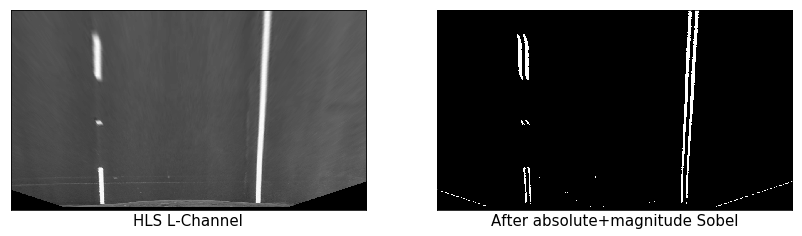

In [146]:
combined_HLS_L = combined_sobel(undist_example_HLS_L, 15, (25, 225))
display(undist_example_HLS_L, combined_HLS_L, 'HLS L-Channel', 'After absolute+magnitude Sobel', 14, 7, cmap='gray')

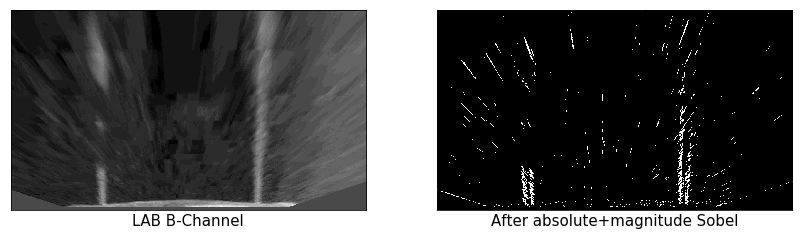

In [147]:
combined_LAB_B = combined_sobel(undist_example_LAB_B, 15, (25, 225))
display(undist_example_LAB_B, combined_LAB_B, 'LAB B-Channel', 'After absolute+magnitude Sobel', 14, 7, cmap='gray')

Now, we'll combine the absolute+magnitude Sobel outputs of both HLS and LAB.

In [148]:
def combined_sobel_colors(img, mag_kernel_size, mag_thresh):
    img_HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_LAB = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    combined_HLS_L = combined_sobel(img_HLS[:,:,1], mag_kernel_size, mag_thresh)
    combined_LAB_B = combined_sobel(img_LAB[:,:,2], mag_kernel_size, mag_thresh)
    combined_sobel_colors_img = np.zeros_like(combined_HLS_L)
    combined_sobel_colors_img[((combined_HLS_L == 1) | (combined_LAB_B == 1))] = 1
    return combined_sobel_colors_img

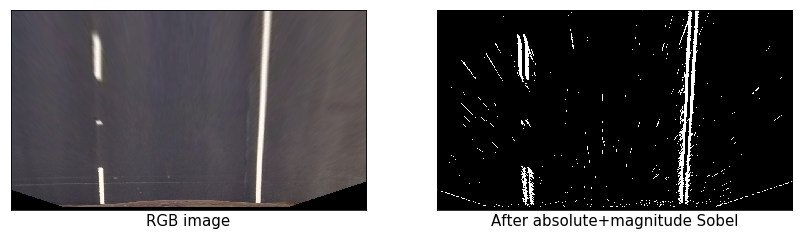

In [149]:
combined_sobel_colors_img = combined_sobel_colors(undist_example_RGB, 15, (25, 225))
display(undist_example_RGB, combined_sobel_colors_img, 'RGB image', 'After absolute+magnitude Sobel', 14, 7, cmap='gray')

---
## Step 5: Define the Image Processing Pipeline

In [150]:
def image_process(img):
    # Undistort
    img = undistort(img, mtx, dist)
    
    # Perspective Transform
    img, M, Minv = perspective_transform(img, src, dst)

    # Create a thresholded binary image
    img = threshold_color_space(img)
    
    return img, Minv

In [151]:
test_images_imgs = []
test_images_processed = []
for file in test_images:
    image = cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    test_images_imgs.append(image)
    image, Minv = image_process(image)
    test_images_processed.append(image)

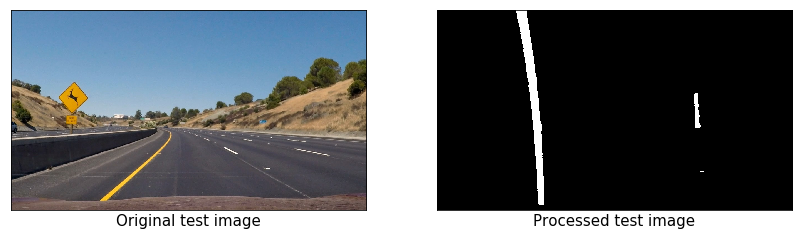

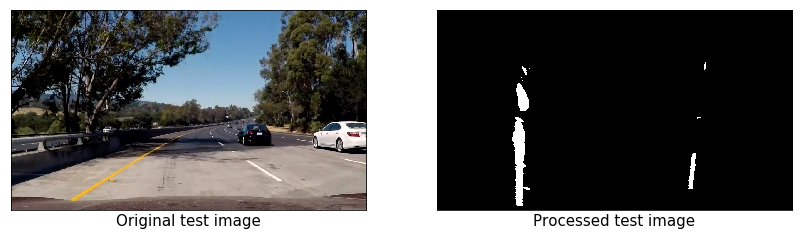

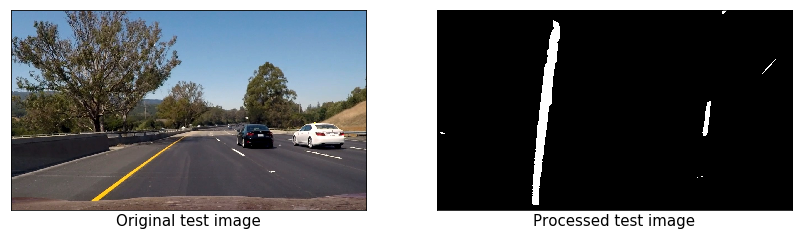

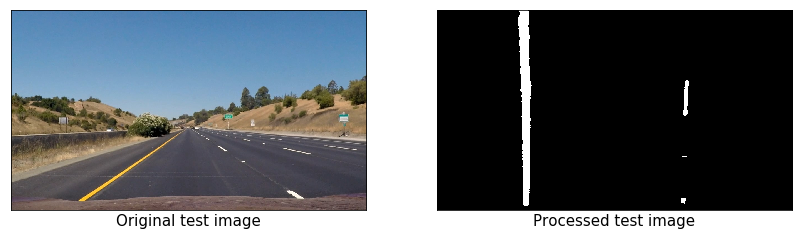

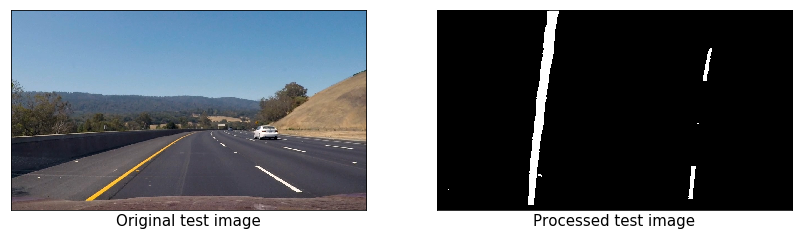

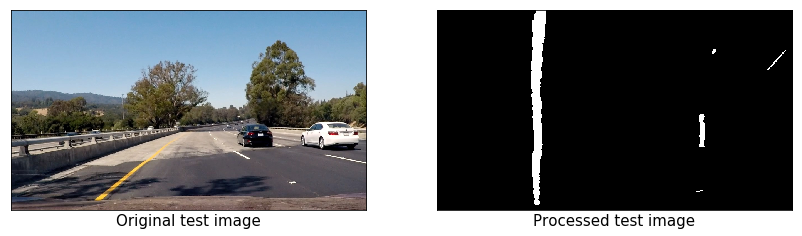

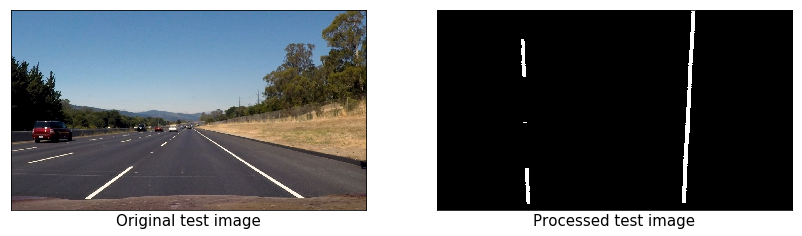

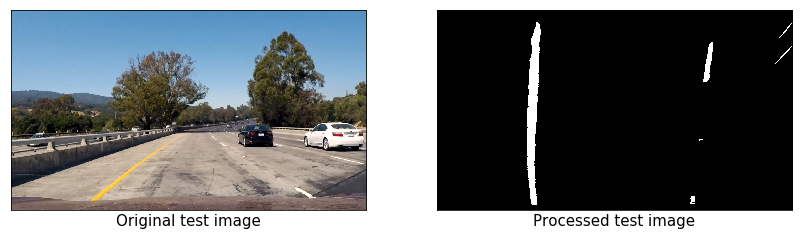

In [152]:
for original, processed in zip(test_images_imgs, test_images_processed):
    display(original,
            processed,
            'Original test image',
            'Processed test image',
            14,
            7,
            cmap='gray')

---
## Step 6: Detect the Lane Lines

In [153]:
def sliding_window(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 50
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &
                           (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

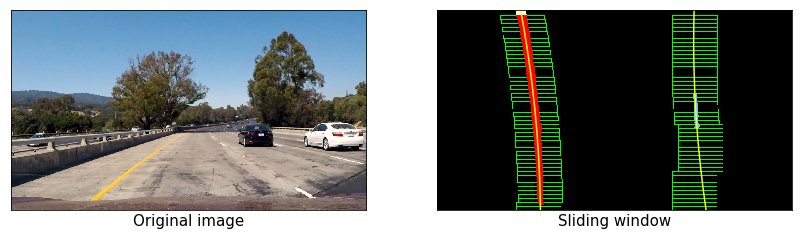

In [154]:
# Visualize the sliding windows over an example test image.

img = test_images_processed[0]
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(img)
h = img.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
rectangles = visualization_data[0]
histogram = visualization_data[1]
# Create an output image to draw on and visualize the result
out_img = np.uint8(np.dstack((img, img, img))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangles:
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.xlabel('Original image', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1, 2, 2)
plt.imshow(out_img)
plt.xlabel('Sliding window', fontsize=15)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.show()

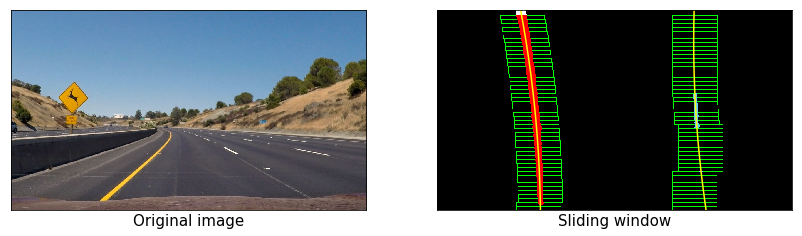

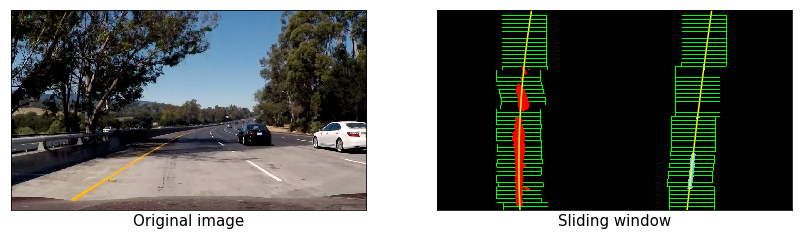

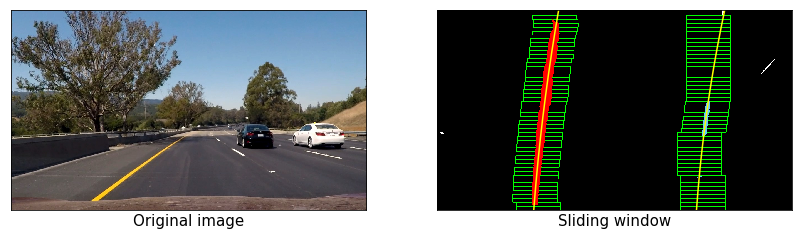

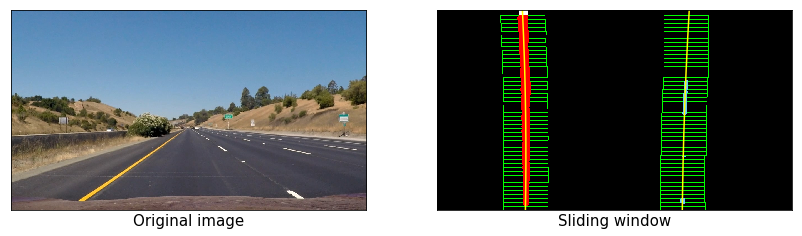

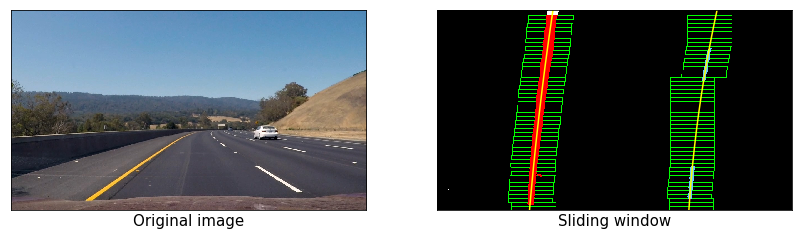

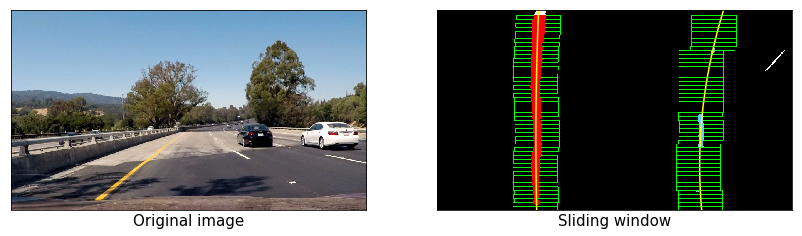

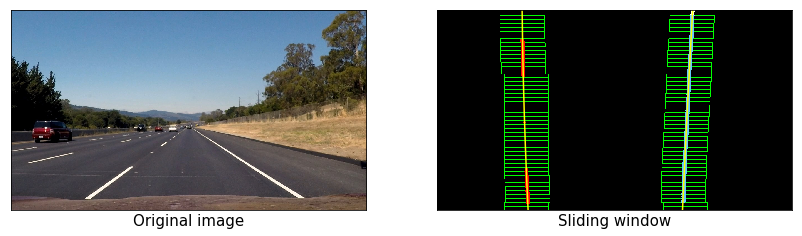

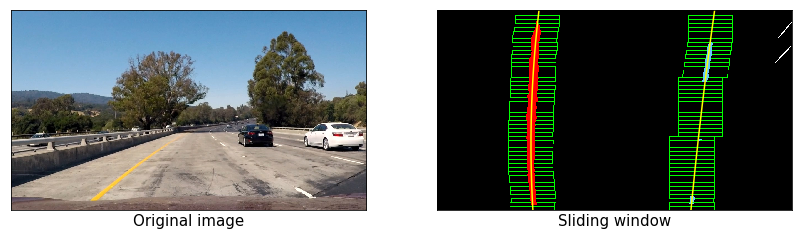

In [155]:
# Visualize the sliding windows over the test images.

for original, processed in zip(test_images_imgs, test_images_processed):
    img = processed
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(img)
    h = img.shape[0]
    left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    rectangles = visualization_data[0]
    histogram = visualization_data[1]
    # Create an output image to draw on and visualize the result
    out_img = np.uint8(np.dstack((img, img, img))*255)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangles:
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.xlabel('Original image', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.xlabel('Sliding window', fontsize=15)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [156]:
def polyfit_prev_fit(img, left_fit_prev, right_fit_prev):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin))
                & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin))
                & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

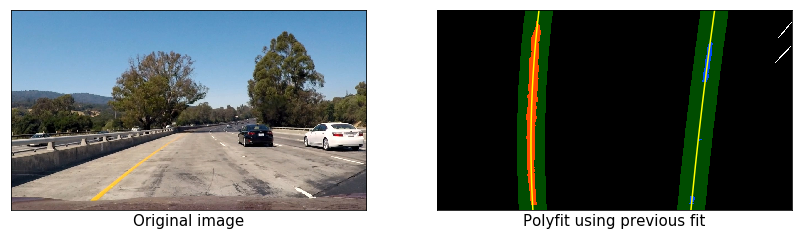

In [157]:
# Visualize the polyfit_prev_fit over the an example image.

margin = 50
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(img)
left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_prev_fit(img, left_fit, right_fit)
ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
out_img = np.uint8(np.dstack((img, img, img))*255)
window_img = np.zeros_like(out_img)
nonzero = img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.xlabel('Original image', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.xlabel('Polyfit using previous fit', fontsize=15)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.show()

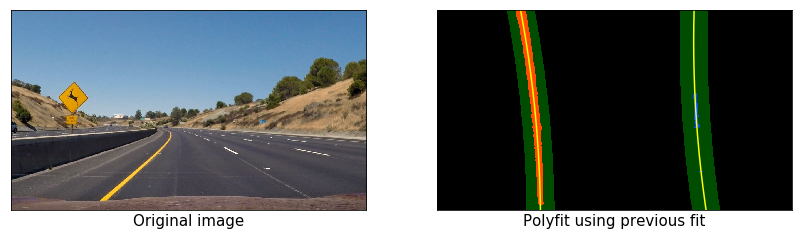

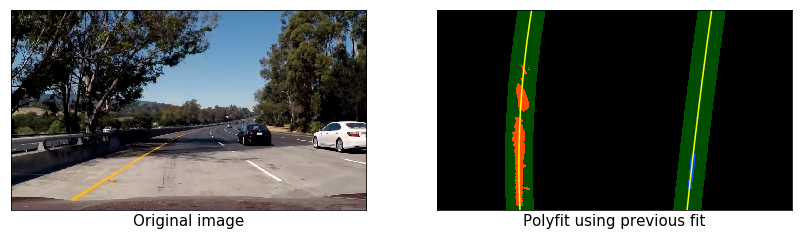

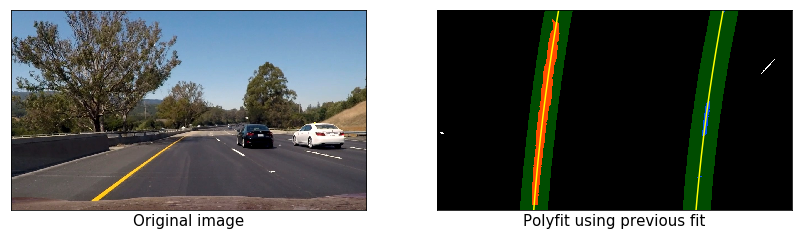

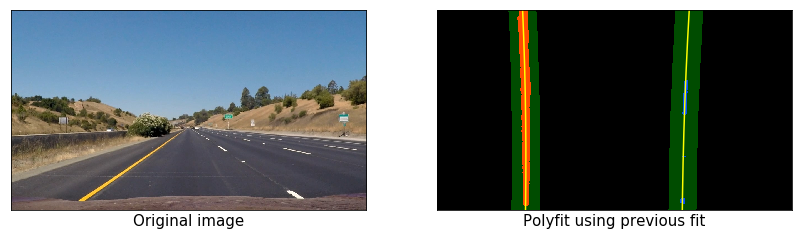

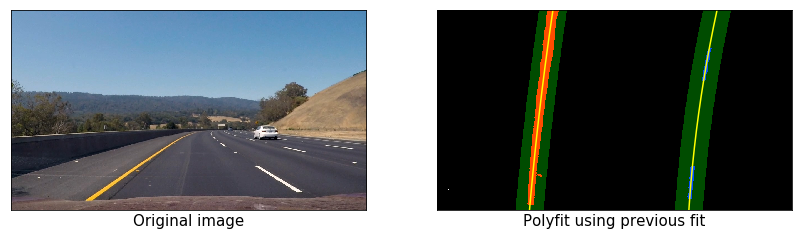

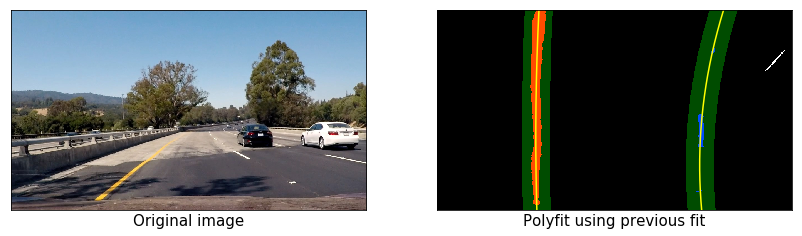

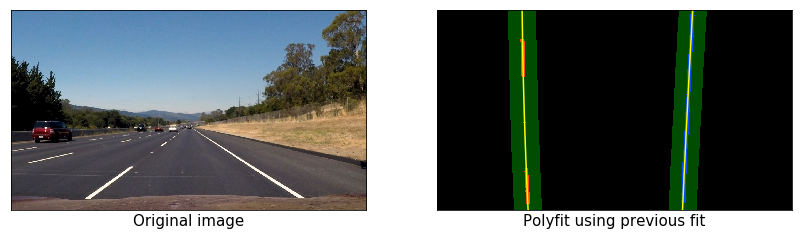

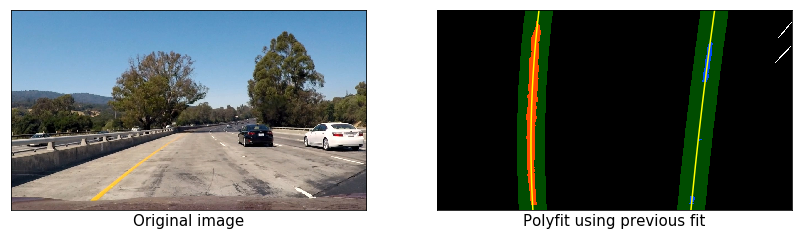

In [158]:
# visualizing polyfit_prev_fit over the test images.

for original, processed in zip(test_images_imgs, test_images_processed):
    img = processed
    margin = 50
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(img)
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_prev_fit(img, left_fit, right_fit)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
    right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
    out_img = np.uint8(np.dstack((img, img, img))*255)
    window_img = np.zeros_like(out_img)
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.xlabel('Original image', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.xlabel('Polyfit using previous fit', fontsize=15)
    plt.plot(left_fitx2, ploty, color='yellow')
    plt.plot(right_fitx2, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

---
## Step 7: Determine the Curvature of the Lane and Vehicle Position

In [159]:
def curv_pos(img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

Radius of curvature for example: 384.452509561 m, 1467.26366382 m
Distance from lane center for example: 0.0857271160074 m


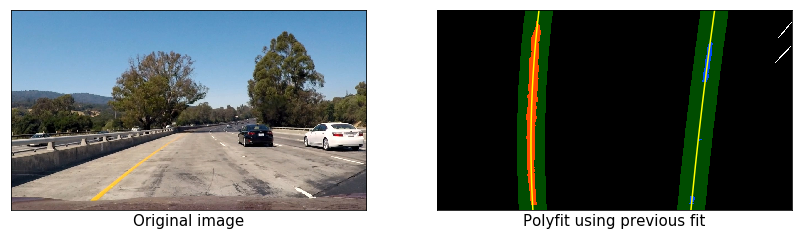

In [160]:
# Visualize the curv_pos over the an example image.

rad_l, rad_r, d_center = curv_pos(test_images_processed[7], left_fit, right_fit, left_lane_inds2, right_lane_inds2)
print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(original)
plt.xlabel('Original image', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.xlabel('Polyfit using previous fit', fontsize=15)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.show()

Radius of curvature for example: 387.366812221 m, 393.865968941 m
Distance from lane center for example: -0.313297281825 m


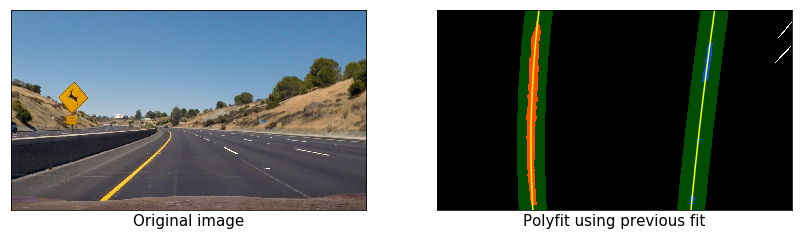

Radius of curvature for example: 320.909253972 m, 1850.78714628 m
Distance from lane center for example: 0.381400178418 m


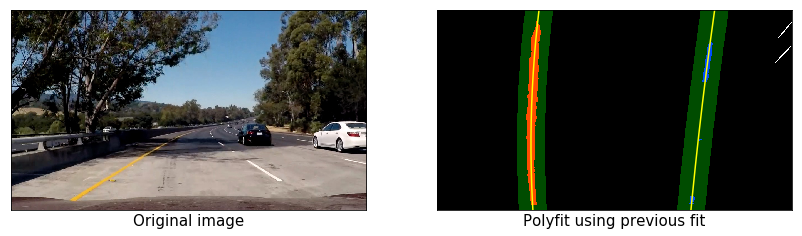

Radius of curvature for example: 691.065518109 m, 481.864869914 m
Distance from lane center for example: -0.0280016232205 m


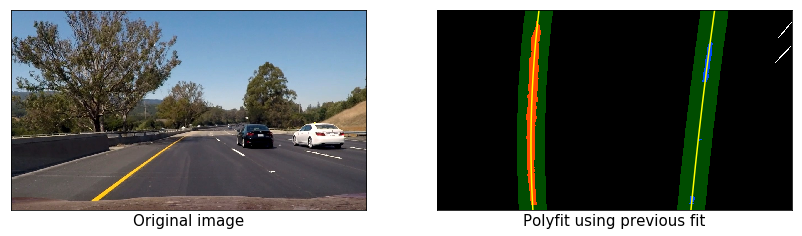

Radius of curvature for example: 1034.57782916 m, 1424.89487852 m
Distance from lane center for example: 0.370211032519 m


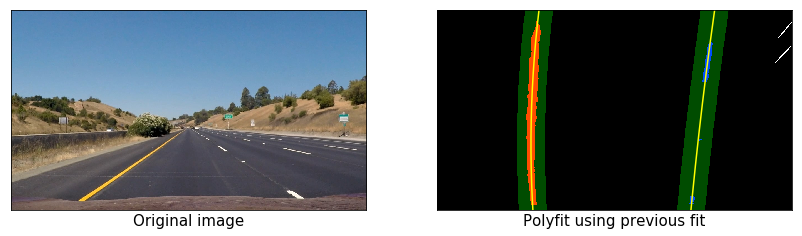

Radius of curvature for example: 1070.12863712 m, 446.77916825 m
Distance from lane center for example: 0.180976983033 m


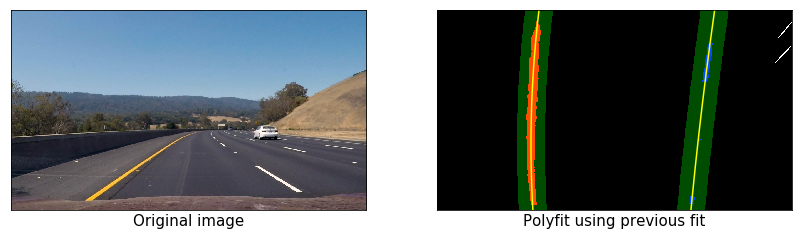

Radius of curvature for example: 1042.90676628 m, 172.381376795 m
Distance from lane center for example: -0.169491905025 m


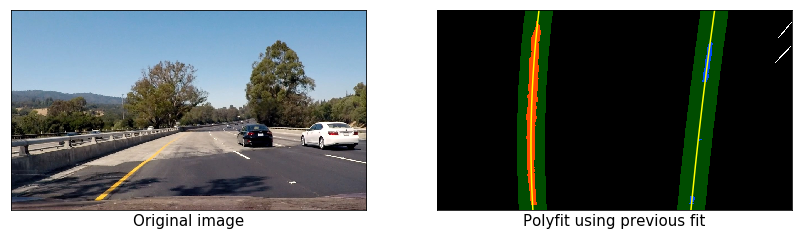

Radius of curvature for example: 1806.1431684 m, 5380.16941456 m
Distance from lane center for example: 0.319271281456 m


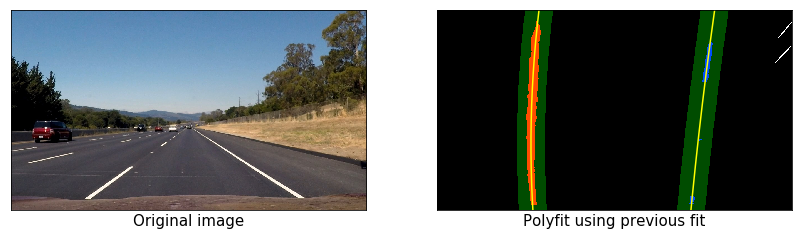

Radius of curvature for example: 384.452509561 m, 1467.26366382 m
Distance from lane center for example: 0.0857271160074 m


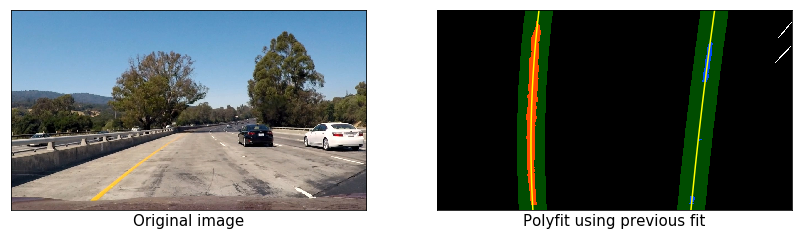

In [161]:
# Visualize the curv_pos over the test images.

for original, processed in zip(test_images_imgs, test_images_processed):
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(processed)
    rad_l, rad_r, d_center = curv_pos(processed, left_fit, right_fit, left_lane_inds, right_lane_inds)
    print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
    print('Distance from lane center for example:', d_center, 'm')
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.xlabel('Original image', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.xlabel('Polyfit using previous fit', fontsize=15)
    plt.plot(left_fitx2, ploty, color='yellow')
    plt.plot(right_fitx2, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()


---
## Step 8: Visual display of the Lane Boundaries and Numerical Estimation of Lane Curvature and Vehicle Position

In [162]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

In [163]:
def write_data(original_img, curv_rad, center_dist):
    """
    Write the lane curvature and vehicle position over the input image.
        Parameters:
            original_img: Input frame.
            curv_rad: Lane curvature.
            center_dist: Vehicle position.
    """
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of curvature: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    return new_img

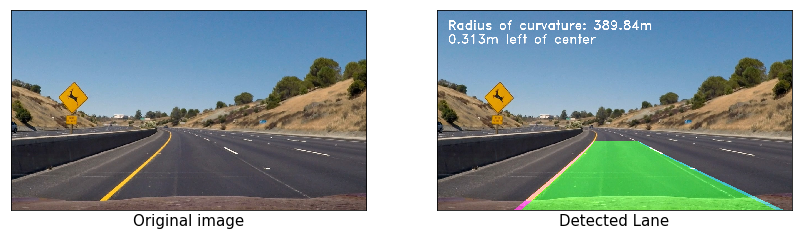

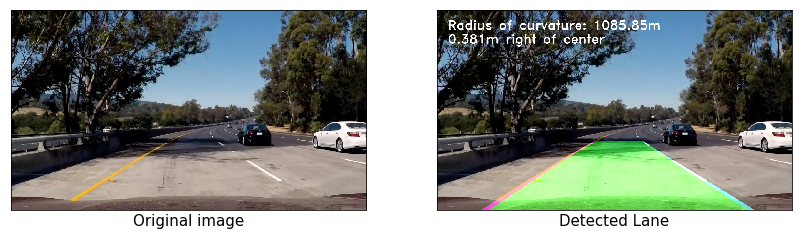

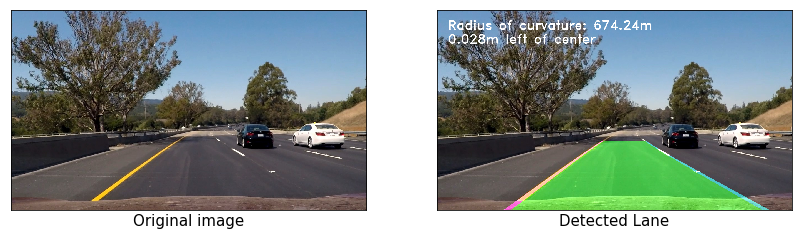

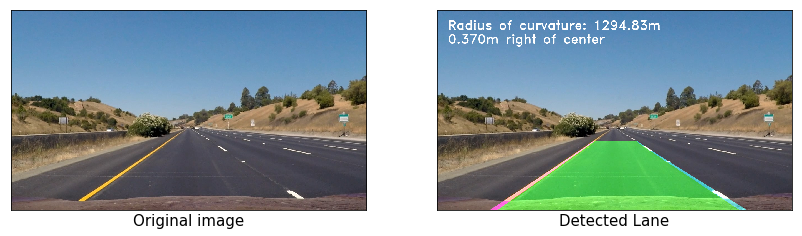

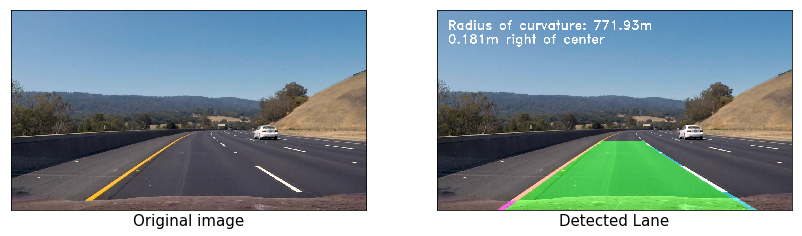

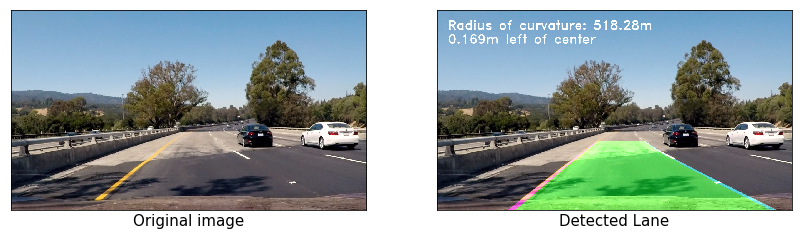

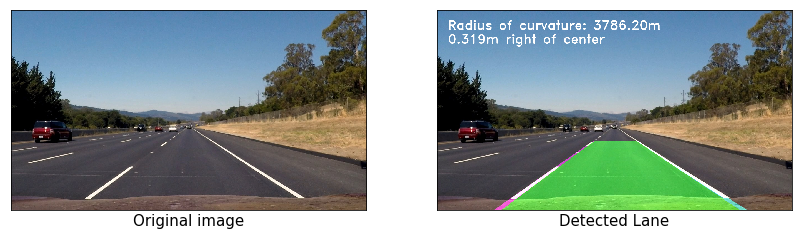

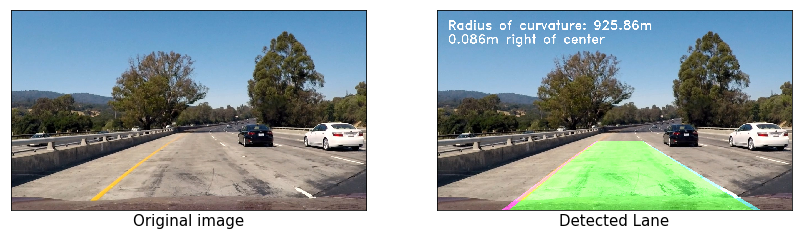

In [164]:
for original, processed in zip(test_images_imgs, test_images_processed):
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(processed)
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_prev_fit(processed, left_fit, right_fit)
    rad_l, rad_r, d_center = curv_pos(processed, left_fit, right_fit, left_lane_inds2, right_lane_inds2)
    result = draw_lane(original, processed, left_fit, right_fit, Minv)
    result = write_data(result, (rad_l+rad_r)/2, d_center)
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.xlabel('Original image', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.xlabel('Detected Lane', fontsize=15)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

---
## Step 9: Process Project Videos

In [165]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        if fit is not None:
            self.detected = True
            self.px_count = np.count_nonzero(inds)
            self.current_fit.append(fit)
            if len(self.current_fit) > 5:
                self.current_fit = self.current_fit[len(self.current_fit)-5:]
            self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)

In [166]:
def frame_processor(img):
    new_img = undistort(np.copy(img), mtx, dist)
    img_bin, Minv = image_process(img)
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    img_out1 = draw_lane(new_img, img_bin, l_fit, r_fit, Minv)
    rad_l, rad_r, d_center = curv_pos(img_bin, l_fit, r_fit, l_lane_inds, r_lane_inds)
    img_out = write_data(img_out1, (rad_l+rad_r)/2, d_center)
    return img_out

**Processing the project video:**

In [167]:
l_line = Line()
r_line = Line()
project_video_output = 'project_video_output.mp4'
project_video_input = VideoFileClip('project_video.mp4')
processed_video = project_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(project_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [06:17<00:00,  3.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 1s, sys: 3.37 s, total: 4min 5s
Wall time: 6min 20s


**Processing the challenge video:**

In [168]:
l_line = Line()
r_line = Line()
challenge_video_output = 'challenge_video_output.mp4'
challenge_video_input = VideoFileClip('challenge_video.mp4')
processed_video = challenge_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(challenge_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [02:15<00:00,  3.53it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 27s, sys: 1.27 s, total: 1min 28s
Wall time: 2min 18s


**Processing the harder challenge video:**

In [169]:
l_line = Line()
r_line = Line()
harder_challenge_video_output = 'harder_challenge_video_output.mp4'
harder_challenge_video_input = VideoFileClip('harder_challenge_video.mp4')
processed_video = harder_challenge_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(harder_challenge_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_video_output))

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [06:53<00:00,  3.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 4min 4s, sys: 2.88 s, total: 4min 7s
Wall time: 6min 58s
